# CS 504 Assignment 2
- Adversarial Machine Learning
- Homework Assignment 2
- Objective:Implement black-box evasion attacks against deep learning-based classification models.

### Task 1: Train a ResNet50 model for classification of the scene classes in the dataset.
- Dataset: We will use the FIGRIM dataset, consisting of 4,436 images of 11 scenes.
- Perform hyper-parameters tuning to obtain an accuracy on the test dataset above 90%.

### Report (20 marks): 
- Report the classification accuracy for the train set, validation set, and test set of images.
- For full marks, it is expected to report a test accuracy above 90%. 
- Plot the training and validation loss and accuracy curves.
- If applicable, provide any other observations regarding the training of the model.

In [2]:
import sys;import cv2;import os
from os import listdir
import datetime;import pickle;import natsort
import numpy as np
import pandas as pd

from rich.console import Console
from rich.table import Table
import keras
import tensorflow as tf
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

from tensorflow.keras.models import load_model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import Model
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau, LearningRateScheduler
from tensorflow.keras.utils import to_categorical

from art.estimators.classification import KerasClassifier,TensorFlowV2Classifier
from art.attacks.evasion import FastGradientMethod, ProjectedGradientDescent, BoundaryAttack

print("TensorFlow version:{}".format(tf.__version__))
print("Keras version:{}".format(keras.__version__))
print("GPUs Available: ", tf.config.list_physical_devices('GPU'))

np.random.seed(17)
tf.compat.v1.set_random_seed(17)
tf.random.set_seed(17)
config = tf.compat.v1.ConfigProto(intra_op_parallelism_threads=1, inter_op_parallelism_threads=1,log_device_placement =True)
config.gpu_options.allow_growth = True
sess = tf.compat.v1.Session(graph = tf.compat.v1.get_default_graph(), config = config)
tf.compat.v1.keras.backend.set_session(sess)
tf.compat.v1.disable_eager_execution()

TensorFlow version:2.10.1
Keras version:2.10.0
GPUs Available:  [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
Device mapping:
/job:localhost/replica:0/task:0/device:GPU:0 -> device: 0, name: NVIDIA GeForce RTX 3050 Ti Laptop GPU, pci bus id: 0000:01:00.0, compute capability: 8.6




In [3]:
# controls below with
# learning rate, batch size and epochs set at 
# values found to be experimentally optimal.
# LRfinder helped as well
NUM_CLASSES = 10
subset = 40  
DIM = 224
N_CHANNEL = 3   
INPUT_SHAPE = (DIM,DIM,N_CHANNEL)  
IMG_SHAPE = (DIM,DIM,N_CHANNEL)                                                
BATCH_SIZE = 6 
NUM_EPOCH = 50                            
LR = 1e-5                                
RBW = True
PATIENCE = 7
#names = pd.read_csv("C://data//data//names.csv").values[:, 1]
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  1


In [4]:
def load_images_and_labels(directory):
    imgs_list = []
    labels_list = []
    subfolders_list_1 = listdir(directory)
    subfolders_list = natsort.natsorted(subfolders_list_1)
    lab = 0
    for subfolder_name in subfolders_list:
        sub_dir_path = directory + '/' + subfolder_name
        imagesList = listdir(sub_dir_path)
        for i in range(len(imagesList)):
          tmp_img = cv2.imread(os.path.join(sub_dir_path, imagesList[i]))
          # Resize all images to 224 x 224 pixels
          resized_img = cv2.resize(tmp_img, (224, 224)) 
          img_arr = np.array(resized_img)
          imgs_list.append(img_arr.astype(float))
          labels_list.append(lab)
        lab += 1
    imgs = np.asarray(imgs_list)
    labels = np.asarray(labels_list)
    return imgs, labels

all_images, all_labels = load_images_and_labels('C://data//figrim/')

In [5]:

trainval_images, test_images, trainval_labels, test_labels = train_test_split(all_images, 
                                                                              all_labels, 
                                                                              test_size=0.2, 
                                                                              random_state=17)
train_images, val_images, train_labels, val_labels = train_test_split(trainval_images, 
                                                                      trainval_labels, 
                                                                      test_size=0.2, 
                                                                      random_state=17)
del all_images

In [5]:
label_names = ['airport_terminal', 'amusement_park', 'bedroom', 'bridge', 'castle', 'conference_room',
               'golf_course', 'highway', 'mountain', 'playground']
labelDICT = {0:'airport_terminal', 1:'amusement_park', 2:'bedroom', 3:'bridge', 4:'castle', 5:'conference_room',
               6:'golf_course', 7:'highway', 8:'mountain', 9:'playground'}     

train_labels_onehot = to_categorical(train_labels, NUM_CLASSES)
val_labels_onehot = to_categorical(val_labels, NUM_CLASSES)
test_labels_onehot = to_categorical(test_labels, NUM_CLASSES)

# Display the shapes of train, validation, and test datasets
print('Images train shape: {} - Labels train shape: {}'.format(train_images.shape, train_labels.shape))
print('Images validation shape: {} - Labels validation shape: {}'.format(val_images.shape, val_labels.shape))
print('Images test shape: {} - Labels test shape: {}'.format(test_images.shape, test_labels.shape))
print('Images train shape: {} - Labels train shape: {}'.format(train_images.shape, train_labels_onehot.shape))
print('Images validation shape: {} - Labels validation shape: {}'.format(val_images.shape, val_labels_onehot.shape))
print('Images test shape: {} - Labels test shape: {}'.format(test_images.shape, test_labels_onehot.shape))
imgs_adv = test_images[0:subset,:,:,:].copy()
labels_adv = test_labels[0:subset].copy()
labels_adv_onehot = to_categorical(labels_adv, NUM_CLASSES)

# Display the range of images 
print('\nMax pixel value', np.max(train_images))
print('Min pixel value', np.min(train_images))
print('Average pixel value', np.mean(train_images))
print('Data type', train_images[0].dtype)


Images train shape: (2838, 224, 224, 3) - Labels train shape: (2838,)
Images validation shape: (710, 224, 224, 3) - Labels validation shape: (710,)
Images test shape: (888, 224, 224, 3) - Labels test shape: (888,)
Images train shape: (2838, 224, 224, 3) - Labels train shape: (2838, 10)
Images validation shape: (710, 224, 224, 3) - Labels validation shape: (710, 10)
Images test shape: (888, 224, 224, 3) - Labels test shape: (888, 10)

Max pixel value 255.0
Min pixel value 0.0
Average pixel value 121.61340665775427
Data type float64


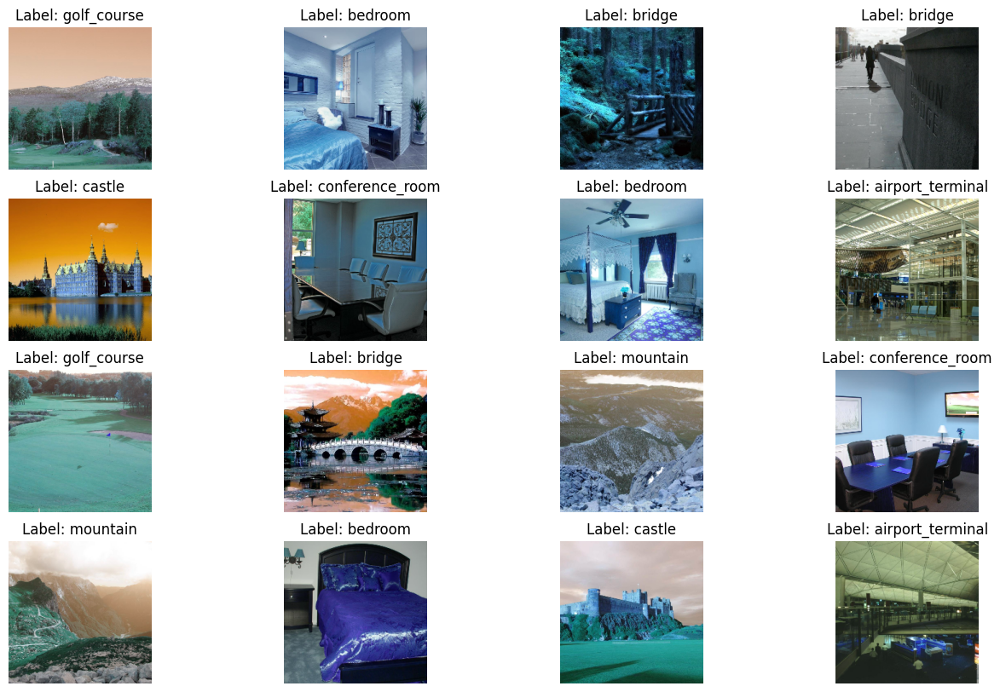

In [6]:
plt.figure(figsize=(16, 10))
for n in range(16):
    i = np.random.randint(0, len(train_images), 1)
    ax = plt.subplot(4, 4, n+1)
    plt.imshow(train_images[i[0]].astype(int))
    plt.title('Label: ' + str(label_names[train_labels[i[0]]]))
    plt.axis('off')

In [ ]:
def build_model0():
    base_model = tf.keras.applications.ResNet50(include_top=False,weights="imagenet",input_shape=INPUT_SHAPE)
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(1024, activation='relu')(x)
    x = Dropout(0.25)(x)
    x = Dense(256, activation='relu')(x)
    x = Dropout(0.25)(x)
    predictions = Dense(NUM_CLASSES, activation='softmax')(x)
    model = Model(inputs=base_model.input, outputs=predictions)
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=LR),
              loss='categorical_crossentropy',
              metrics = ['accuracy'])
    
    return model

In [ ]:
callbacks = [EarlyStopping(monitor='val_loss',patience = PATIENCE,restore_best_weights=RBW),
             ReduceLROnPlateau(monitor='val_loss',factor=0.1,patience = PATIENCE,min_lr = 1e-7, verbose = 1)]

In [ ]:
model = build_model0()

t = datetime.datetime.now()

history = model.fit(x= train_images,
    y= train_labels_onehot,
    batch_size=BATCH_SIZE,
    epochs=NUM_EPOCH,
    
    validation_data=(val_images, val_labels_onehot),
    verbose=1,
    callbacks=callbacks)

print('Training time: %s\n' % (datetime.datetime.now() - t))



In [ ]:
t = datetime.datetime.now()
evals_test = model.evaluate(test_images, test_labels_onehot)
print("Classification Accuracy Test: ", evals_test[1])
print('Inference time: %s \n' % (datetime.datetime.now() - t))

t = datetime.datetime.now()
evals_test = model.evaluate(val_images, val_labels_onehot)
print("Classification Accuracy Validation: ", evals_test[1])
print('Inference time: %s \n' % (datetime.datetime.now() - t))

t = datetime.datetime.now()
evals_test = model.evaluate(train_images, train_labels_onehot)
print("Classification Accuracy Train: ", evals_test[1])
print('Inference time: %s' % (datetime.datetime.now() - t))

In [ ]:
#model.save('C://data//data//model//R50_figrim_reborn')
#np.save("C://data//data//model//R50_figrim_HistoryDict_reborn.npy", history.history)

In [7]:
model = load_model('C://data//data//model//R50_figrim_reborn')
history = np.load("C://data//data//model//R50_figrim_HistoryDict_reborn.npy",allow_pickle=True).item()

Instructions for updating:
Colocations handled automatically by placer.


In [ ]:
train_loss = history['loss']
val_loss = history['val_loss']
acc = history['accuracy'] 
val_acc = history['val_accuracy']

epochsn = np.arange(1, len(train_loss)+1,1)
plt.plot(epochsn,train_loss, 'b', label='Training Loss')
plt.plot(epochsn,val_loss, 'r', label='Validation Loss')
plt.grid(color='gray', linestyle='--')
plt.legend()
plt.title('LOSS Resnet-50 on Imagenette')
plt.xlabel('Epochs')
plt.ylabel('Loss')

axes = plt.gca()

plt.figure()
plt.plot(epochsn, acc, 'b', label='Training Accuracy')
plt.plot(epochsn, val_acc, 'r', label='Validation Accuracy')
plt.grid(color='gray', linestyle='--')
plt.legend()            
plt.title('ACCURACY Resnet-50 on Imagenette')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.show()

In [ ]:
t = datetime.datetime.now()
evals_test = model.evaluate(test_images, test_labels_onehot)
print("Classification Accuracy Test: ", evals_test[1])
print('Inference time: %s \n' % (datetime.datetime.now() - t))
eval_T = evals_test
t = datetime.datetime.now()
evals_test = model.evaluate(val_images, val_labels_onehot)
print("Classification Accuracy Validation: ", evals_test[1])
print('Inference time: %s \n' % (datetime.datetime.now() - t))
eval_V = evals_test
t = datetime.datetime.now()
evals_test = model.evaluate(train_images, train_labels_onehot)
print("Classification Accuracy Train: ", evals_test[1])
print('Inference time: %s' % (datetime.datetime.now() - t))
eval_R = evals_test
R50_statsBEST = pd.DataFrame(list(zip(eval_R,eval_V,eval_T)),columns = ["training","validate","test"])
R50_statsBEST = R50_statsBEST.drop(0)
R50_statsBEST.to_pickle("part1BEST")

In [6]:
part1 = pd.read_pickle("part1BEST")
console = Console()
style = "bold blue"
table = Table('Part1 results:FIGRIM on Resnet-50')
table.add_row(part1.to_string(float_format=lambda _: '{:.2%}'.format(_)))
console.print(table)#,style = style)

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Part1 results:FIGRIM on Resnet-50 ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│    training  validate   test      │
│ 1    99.93%    95.63% 94.37%      │
└───────────────────────────────────┘

## Task 2: Implement an untargeted boundary attack against the trained model.
- Step 1: Select one image from the test dataset to be used for creating an adversarial sample. 
- Make sure that the DL classifier correctly predicts the class of the image.
- To check it, plot the image with the ground truth label and the predicted label by the DL model.

### Step 1: Create a single adversarial sample, pay attention to the shapes of the data.

- Note that the model works with batches of images, so when we have a single image of size (224, 224, 3) we will need to first reshape it into a batch of one image of size (1, 224, 224, 3) before we pass it to the model. 

- **if we feed the image with size (224, 224, 3), we will get an error.**



(224, 224, 3)


C:\Users\12084\anaconda3\envs\tf_gpu\lib\site-packages\keras\engine\training_v1.py:2356: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


Selected image is correctly classified by ResNet50 model


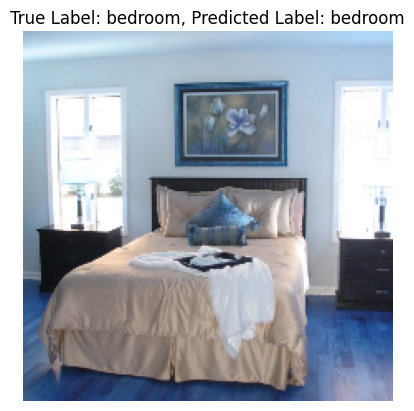

In [8]:
i = np.random.randint(0, len(train_images), 1)
image = train_images[i[0]]
print(image.shape)
label = train_labels[i[0]]
labelH= train_labels_onehot[i[0]]


output = model.predict(image[np.newaxis, ...])
predicted = np.argmax(output, axis=1)
if predicted == label:
    print("Selected image is correctly classified by ResNet50 model")
else:
    print("Selected image is misclassified by the ResNet50 model")
    
    
plt.imshow(train_images[i[0]].astype(int))
plt.axis('off')
plt.title(f'True Label: {label_names[int(label)]}, Predicted Label: {label_names[int(predicted)]}')
plt.show()

### Step 2: Using the boundary attack, create an adversarial image that will change the label of the selected original image. 
- use similar parameters for the attack as in the above example notebook in the ART toolbox, or if you wish you can adopt different parameters. Print the L2 norm and the label of the adversarial image for each step of the attack


Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations: 0it [00:00, ?it/s]

Adversarial image at step 0. L2 NORM: 39565.65366312952 and class label 3.


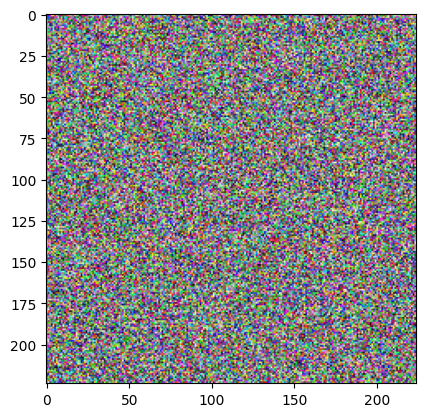

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/50 [00:00<?, ?it/s]

Adversarial image at step 50. L2 NORM: 18219.285115002946 and class label 4.


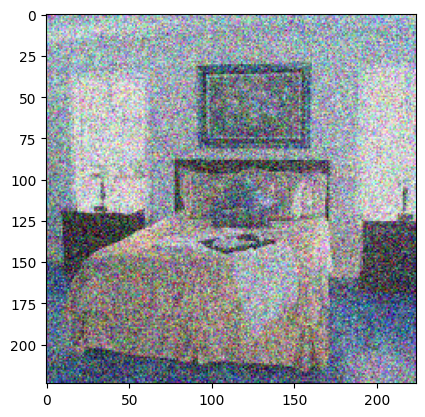

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/50 [00:00<?, ?it/s]

Adversarial image at step 100. L2 NORM: 15688.610213644739 and class label 4.


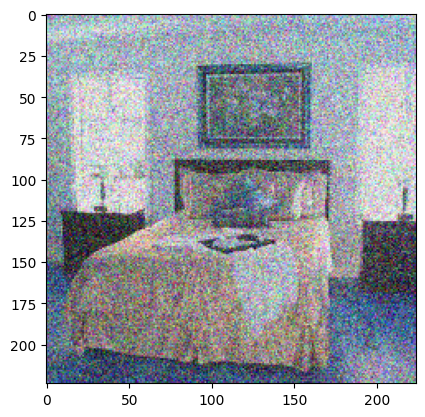

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/50 [00:00<?, ?it/s]

Adversarial image at step 150. L2 NORM: 14210.267084251374 and class label 4.


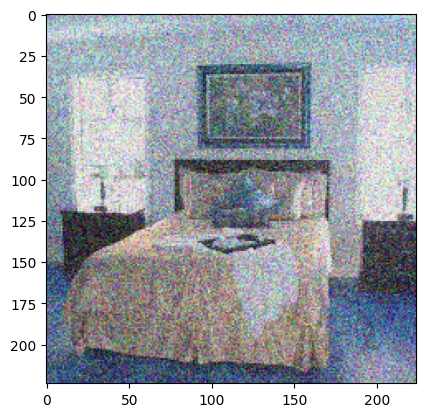

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/50 [00:00<?, ?it/s]

Adversarial image at step 200. L2 NORM: 13303.484081803503 and class label 4.


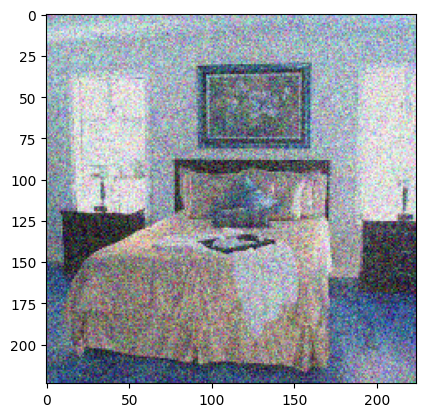

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/50 [00:00<?, ?it/s]

Adversarial image at step 250. L2 NORM: 12523.695590186448 and class label 4.


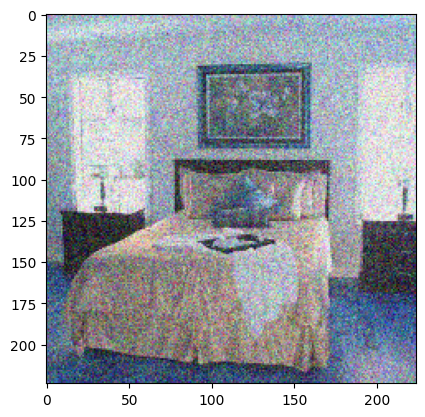

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/50 [00:00<?, ?it/s]

Adversarial image at step 300. L2 NORM: 11567.883000108863 and class label 4.


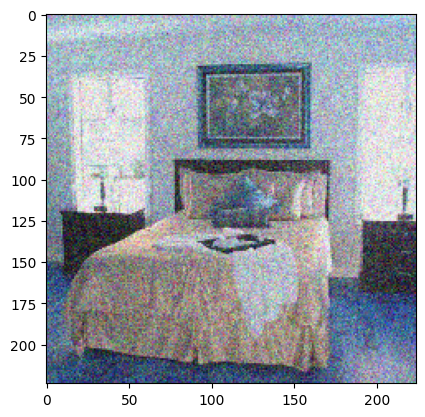

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/50 [00:00<?, ?it/s]

Adversarial image at step 350. L2 NORM: 10714.057406653572 and class label 4.


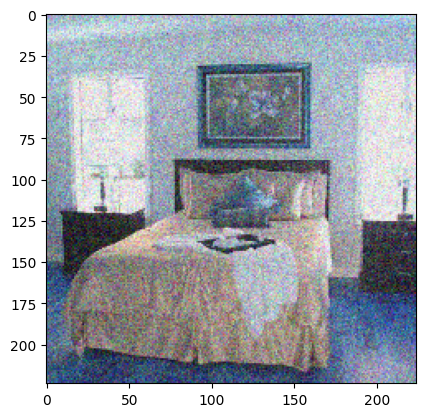

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/50 [00:00<?, ?it/s]

Adversarial image at step 400. L2 NORM: 10101.153329620398 and class label 4.


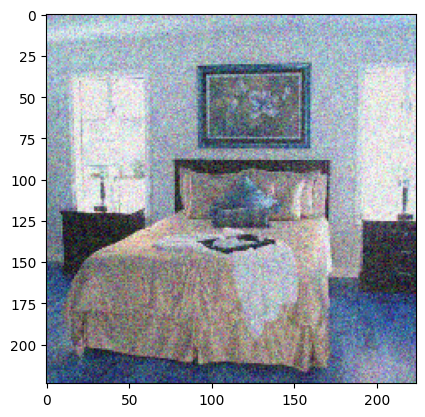

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/50 [00:00<?, ?it/s]

Adversarial image at step 450. L2 NORM: 9519.641456246562 and class label 4.


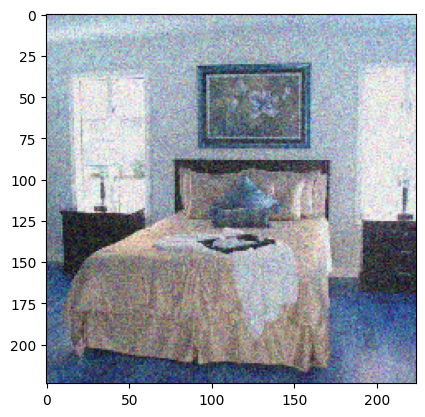

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/50 [00:00<?, ?it/s]

Adversarial image at step 500. L2 NORM: 8929.911106203928 and class label 4.


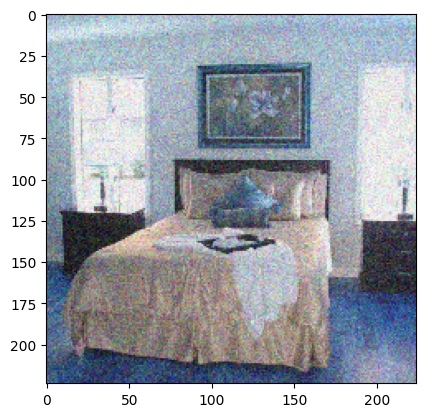

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/50 [00:00<?, ?it/s]

Adversarial image at step 550. L2 NORM: 8576.5887601481 and class label 4.


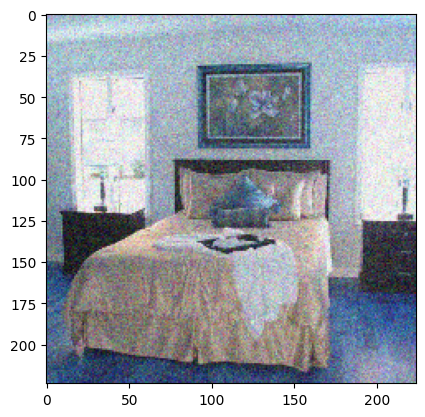

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/50 [00:00<?, ?it/s]

Adversarial image at step 600. L2 NORM: 8101.332023584936 and class label 4.


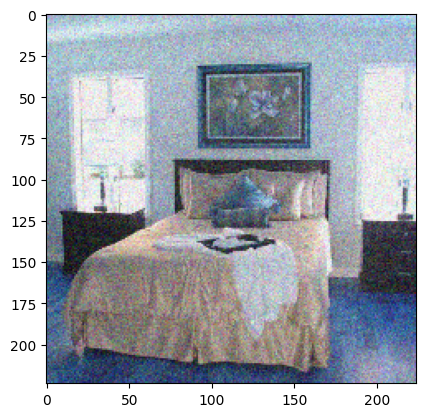

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/50 [00:00<?, ?it/s]

Adversarial image at step 650. L2 NORM: 7627.142173328974 and class label 4.


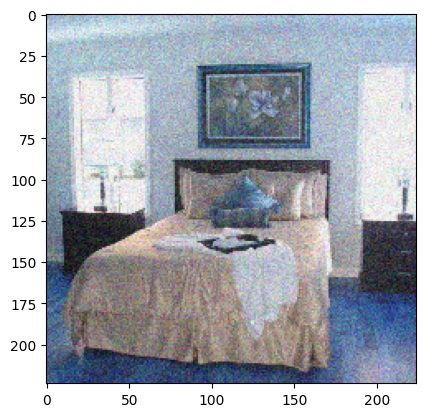

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/50 [00:00<?, ?it/s]

Adversarial image at step 700. L2 NORM: 7231.9592505014625 and class label 4.


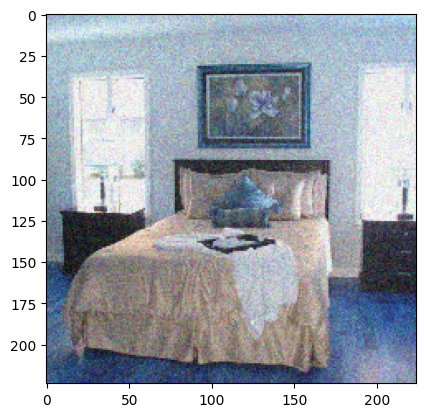

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/50 [00:00<?, ?it/s]

Adversarial image at step 750. L2 NORM: 6688.271372806943 and class label 4.


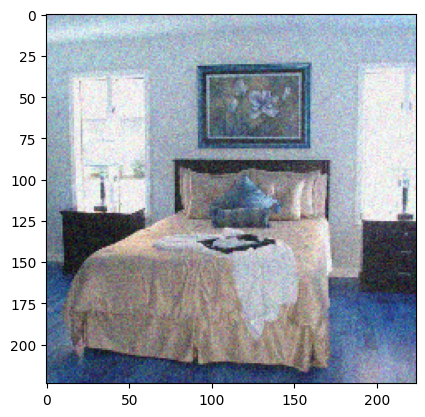

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/50 [00:00<?, ?it/s]

Adversarial image at step 800. L2 NORM: 6087.864081547097 and class label 4.


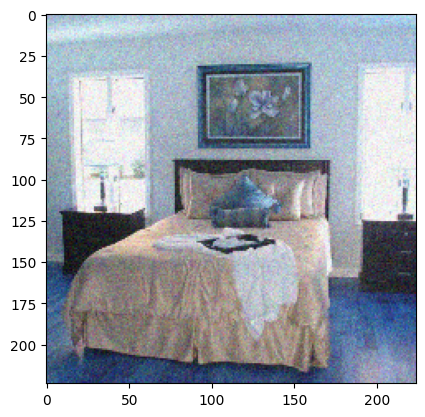

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/50 [00:00<?, ?it/s]

Adversarial image at step 850. L2 NORM: 5420.939205827591 and class label 4.


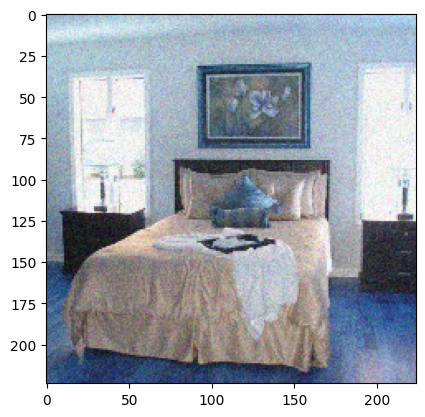

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/50 [00:00<?, ?it/s]

Adversarial image at step 900. L2 NORM: 4676.166096489844 and class label 4.


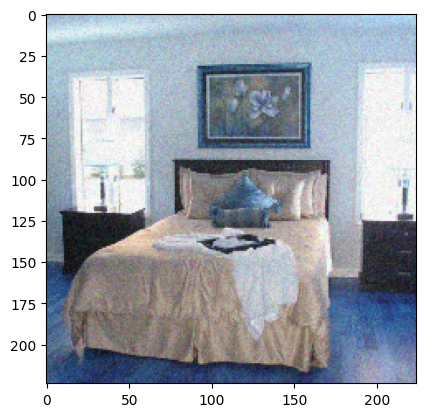

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/50 [00:00<?, ?it/s]

Adversarial image at step 950. L2 NORM: 4070.4650074440224 and class label 4.


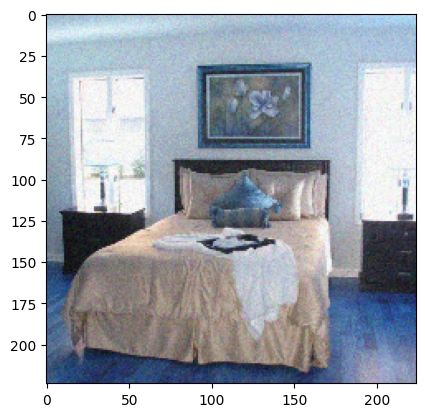

In [9]:

classifier = KerasClassifier(clip_values=(0, 255), model=model)
attack = BoundaryAttack(estimator=classifier, targeted=False, max_iter=0, delta=0.001, epsilon=0.001)
iter_step = 50
x_adv = None
for i in range(20):
    x_adv = attack.generate(x=np.array([image[..., ::-1]]), x_adv_init=x_adv)

    #clear_output()
    print("Adversarial image at step %d." % (i * iter_step), "L2 NORM:", 
          np.linalg.norm(np.reshape(x_adv[0] - image[..., ::-1], [-1])),
          "and class label %d." % np.argmax(classifier.predict(x_adv)[0]))
    plt.imshow(x_adv[0][..., ::-1].astype(np.uint))
    plt.show(block=False)
    
    if hasattr(attack, 'curr_delta') and hasattr(attack, 'curr_epsilon'):
        attack.max_iter = iter_step 
        attack.delta = attack.curr_delta
        attack.epsilon = attack.curr_epsilon
    else:
        break


### Step 3: Plot the adversarial image with the predicted label by the classifier


In [10]:
output = model.predict(x_adv)
predicted = np.argmax(output, axis=1)
if predicted == label:
    print("Selected image is correctly classified by ResNet50 model")
else:
    print("Selected image is misclassified by the ResNet50 model")

Selected image is misclassified by the ResNet50 model


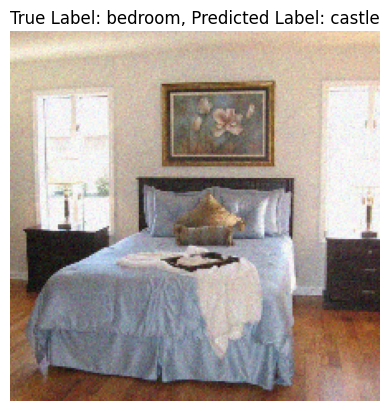

In [11]:
F = x_adv[0]
plt.imshow(F.astype(int))
plt.axis('off')
plt.title(f'True Label: {label_names[int(label)]}, Predicted Label: {label_names[int(predicted)]}')
plt.show()

### Step 4: Plot the difference between the selected image and the adversarial image.

   **Show the color bar of the difference.**

In [12]:
#plt.imshow(F.astype(int))
#plt.imshow(image.astype(int))

In [13]:
diff=F-image
diff2 = np.abs(F-image)
norm_diff = cv2.normalize(diff, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U)
cmap = plt.cm.jet

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


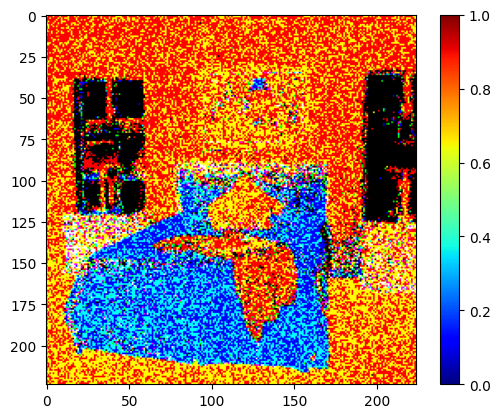

In [14]:
plt.imshow(diff, cmap=cmap)
plt.colorbar()
plt.show()

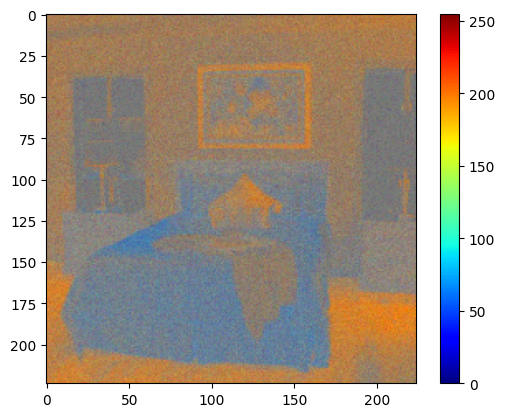

In [15]:
plt.imshow(norm_diff, cmap=cmap)
plt.colorbar()
plt.show()

# targeted boundary

In [16]:
i = np.random.randint(0, len(train_images), 1)
image = train_images[i[0]]
print("sample shape:",image.shape)
label = train_labels[i[0]]
labelH= train_labels_onehot[i[0]]
print(labelDICT[label],label)

i = np.random.randint(0, len(train_images), 1)
target_image = train_images[i[0]]
print("target shape:", target_image.shape)
target_label = train_labels[i[0]]
target_labelH= train_labels_onehot[i[0]]
print(labelDICT[target_label],target_label)

sample shape: (224, 224, 3)
bedroom 2
target shape: (224, 224, 3)
playground 9


Selected image is correctly classified by ResNet50 model


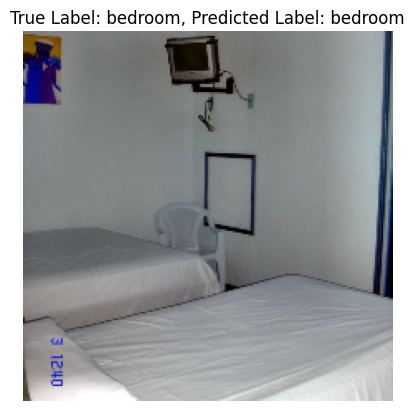

In [17]:
output = model.predict(image[np.newaxis, ...])
predicted = np.argmax(output, axis=1)
if predicted == label:
    print("Selected image is correctly classified by ResNet50 model")
else:
    print("Selected image is misclassified by the ResNet50 model")
    
    
plt.imshow(image.astype(int))
plt.axis('off')
plt.title(f'True Label: {label_names[int(label)]}, Predicted Label: {label_names[int(predicted)]}')
plt.show()

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations: 0it [00:00, ?it/s]

Adversarial image at step 0. L2 error 32723.287594616773 and class label 2.


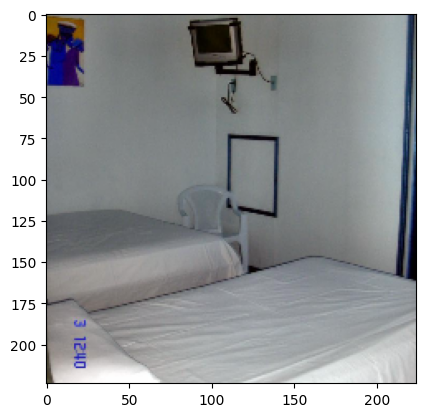

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/200 [00:00<?, ?it/s]

Adversarial image at step 200. L2 error 7105.904501601241 and class label 2.


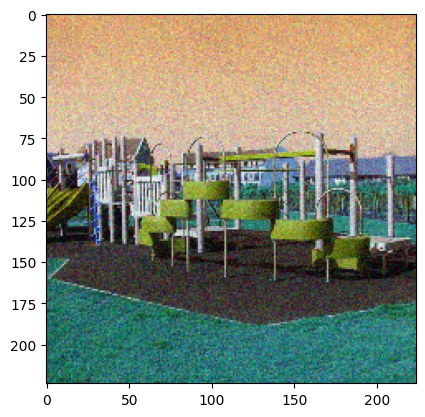

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/200 [00:00<?, ?it/s]

Adversarial image at step 400. L2 error 4966.461032734475 and class label 2.


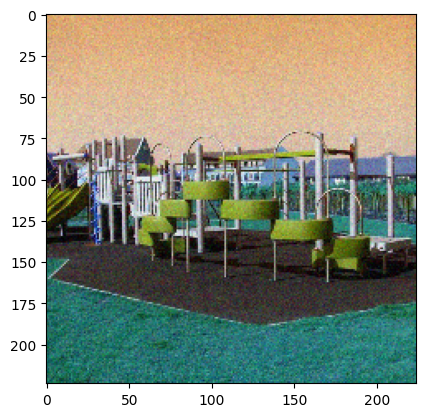

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/200 [00:00<?, ?it/s]

Adversarial image at step 600. L2 error 3928.7293016407693 and class label 2.


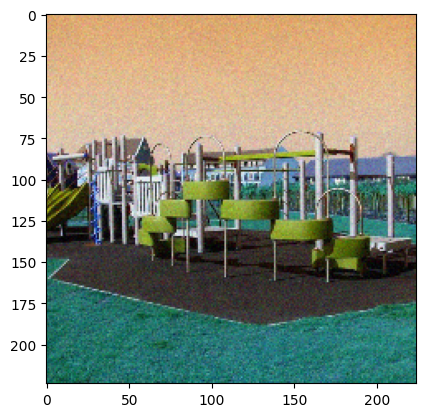

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/200 [00:00<?, ?it/s]

Adversarial image at step 800. L2 error 3243.137765792818 and class label 2.


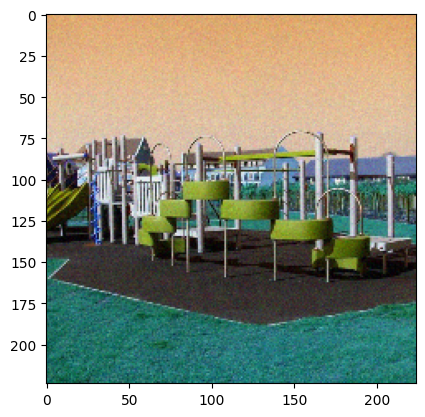

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/200 [00:00<?, ?it/s]

Adversarial image at step 1000. L2 error 2739.376448442306 and class label 2.


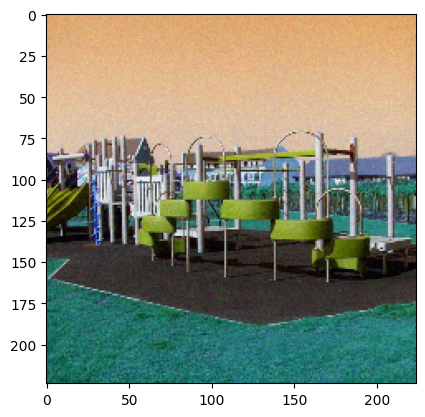

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/200 [00:00<?, ?it/s]

Adversarial image at step 1200. L2 error 2358.8539176198724 and class label 2.


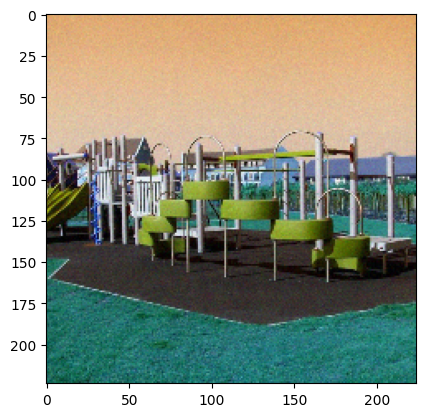

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/200 [00:00<?, ?it/s]

Adversarial image at step 1400. L2 error 2273.3047568932116 and class label 9.


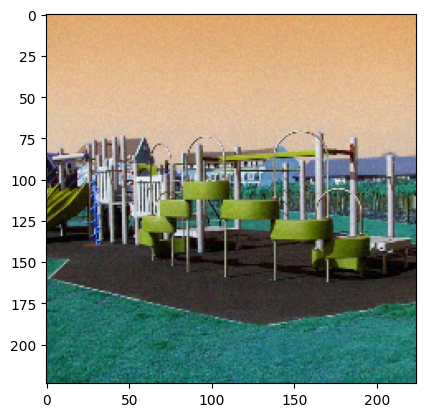

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 1600. L2 error 0.0 and class label 9.


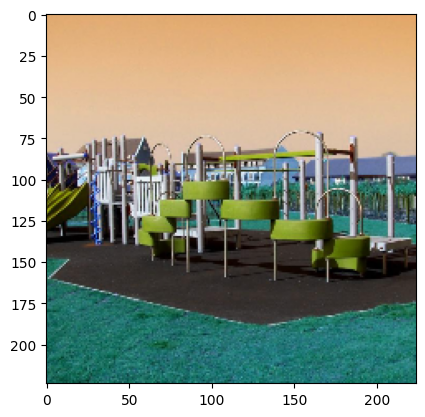

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 1800. L2 error 0.0 and class label 9.


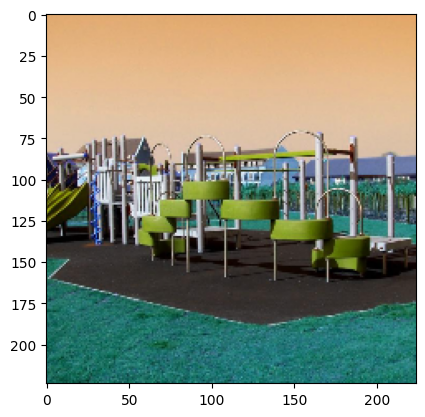

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 2000. L2 error 0.0 and class label 9.


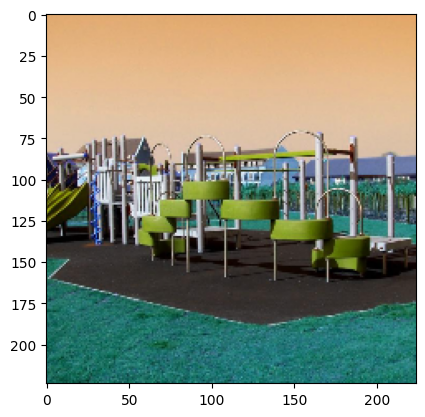

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 2200. L2 error 0.0 and class label 9.


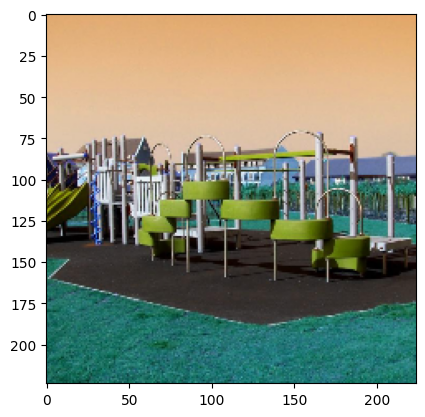

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 2400. L2 error 0.0 and class label 9.


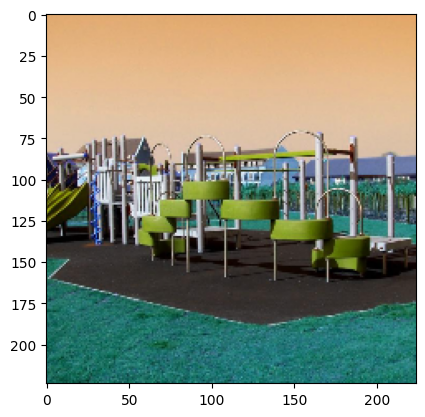

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 2600. L2 error 0.0 and class label 9.


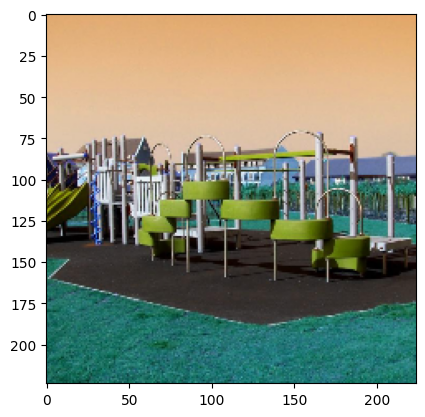

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 2800. L2 error 0.0 and class label 9.


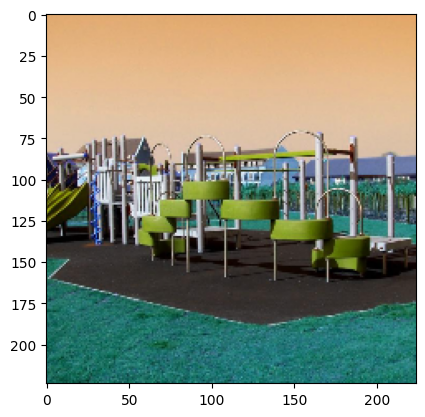

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 3000. L2 error 0.0 and class label 9.


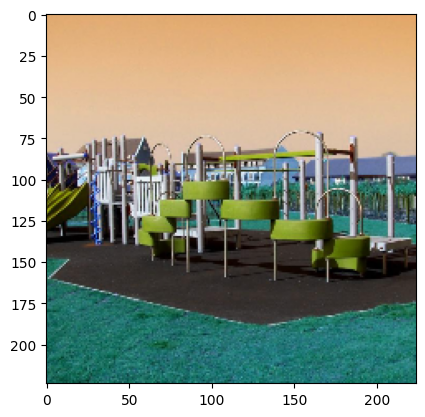

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 3200. L2 error 0.0 and class label 9.


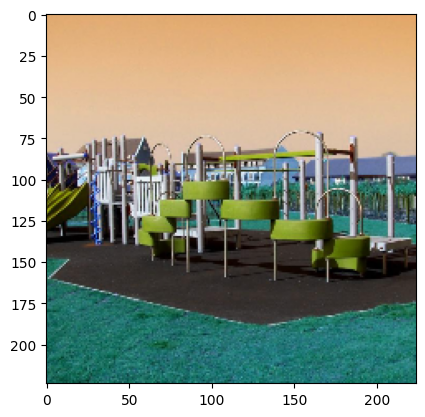

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 3400. L2 error 0.0 and class label 9.


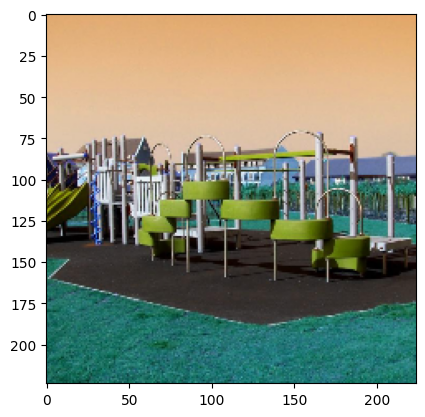

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 3600. L2 error 0.0 and class label 9.


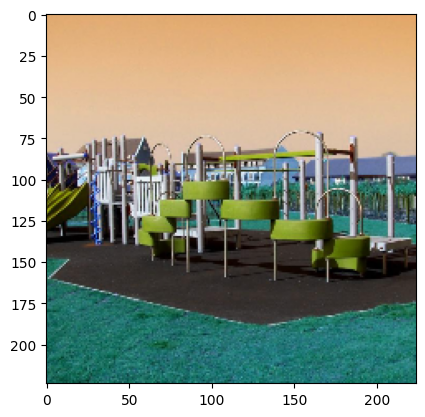

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 3800. L2 error 0.0 and class label 9.


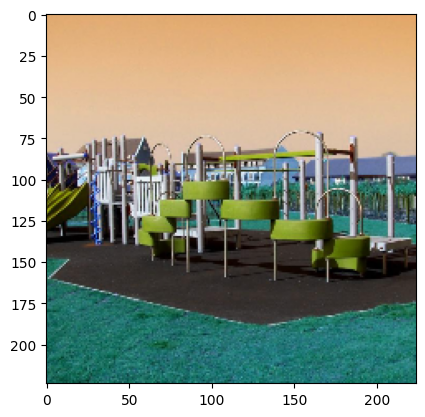

In [18]:
attack = BoundaryAttack(estimator=classifier, targeted=True, max_iter=0, delta=0.001, epsilon=0.001)
iter_step = 200
x_adv = np.array([image[..., ::-1]])

for i in range(20):
    x_adv = attack.generate(x=np.array([target_image[..., ::-1]]), y=to_categorical([label], 10), x_adv_init=x_adv)

    #clear_output()    
    print("Adversarial image at step %d." % (i * iter_step), "L2 error", 
          np.linalg.norm(np.reshape(x_adv[0] - target_image[..., ::-1], [-1])),
          "and class label %d." % np.argmax(classifier.predict(x_adv)[0]))
    plt.imshow(x_adv[0][..., ::-1].astype(np.uint))
    plt.show(block=False)
    
    if hasattr(attack, 'curr_delta') and hasattr(attack, 'curr_epsilon'):
        attack.max_iter = iter_step 
        attack.delta = attack.curr_delta
        attack.epsilon = attack.curr_epsilon
    else:
        break

In [24]:
output = model.predict(x_adv)
predicted = np.argmax(output, axis=1)
if predicted == label:
    print("Selected image is correctly classified by ResNet50 model")
else:
    print("Selected image is misclassified by the ResNet50 model")

Selected image is misclassified by the ResNet50 model


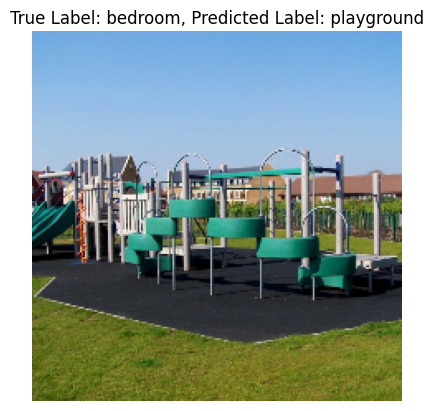

In [25]:
F = x_adv[0]
plt.imshow(F.astype(int))
plt.axis('off')
plt.title(f'True Label: {label_names[int(label)]}, Predicted Label: {label_names[int(predicted)]}')
plt.show()

In [26]:
diff=F-image
diff2 = np.abs(F-image)
norm_diff = cv2.normalize(diff, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U)
cmap = plt.cm.jet

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


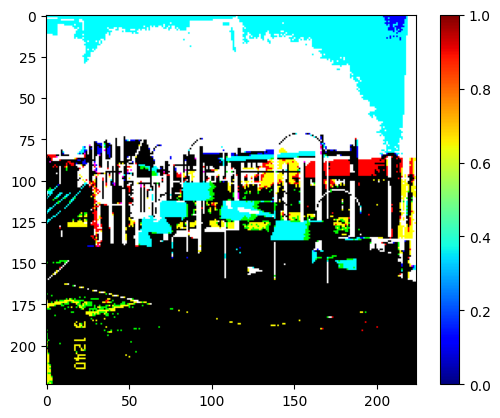

In [27]:
plt.imshow(diff, cmap=cmap)
plt.colorbar()
plt.show()

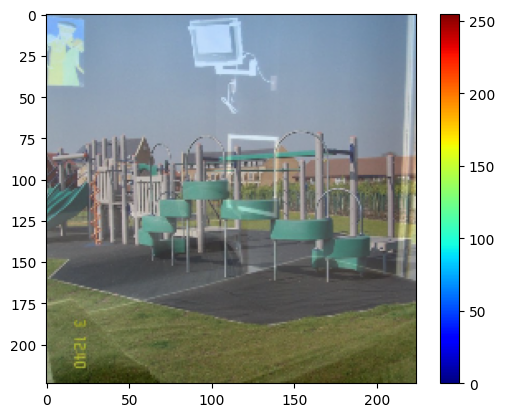

In [28]:
plt.imshow(norm_diff, cmap=cmap)
plt.colorbar()
plt.show()